IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


Loaded SHAP values, test data, predictions, and metadata from SHAP_scores/multi_channel_lstm_static_combined_tudd_1000.json
Selected sample indices for actual survival (label=0):
Predicted Survival: [8, 9, 10, 13, 14, 15, 20, 21, 24, 25, 27, 29, 31, 32, 34, 38, 40, 43, 44, 45, 48, 49, 50, 51, 57, 59, 65, 67, 68, 69, 70, 71, 72, 77, 78, 82, 84, 85, 86, 89]
Predicted Non Survival: [11, 16, 58, 92, 96, 126, 128, 146, 153, 190, 191, 222, 223, 227, 247, 256, 262, 267, 301, 327, 329, 372, 378, 463, 467, 505, 559, 646, 665, 769, 915, 919, 936, 959]
Uncertain: [7, 28, 33, 41, 42, 52, 53, 55, 80, 83, 94, 97, 109, 129, 130, 150, 157, 163, 164, 167, 168, 170, 174, 181, 185, 189, 199, 207, 215, 219, 224, 240, 244, 253, 290, 298, 300, 309, 318, 321]

Selected sample indices for actual non survival (label=1):
Predicted Survival: [3]
Predicted Non Survival: [76, 98, 148, 250, 255, 324, 355, 465, 468, 629, 659, 661, 667, 714, 729, 732, 740, 741, 758, 773, 898, 945, 972]
Uncertain: [134, 277, 295, 384,

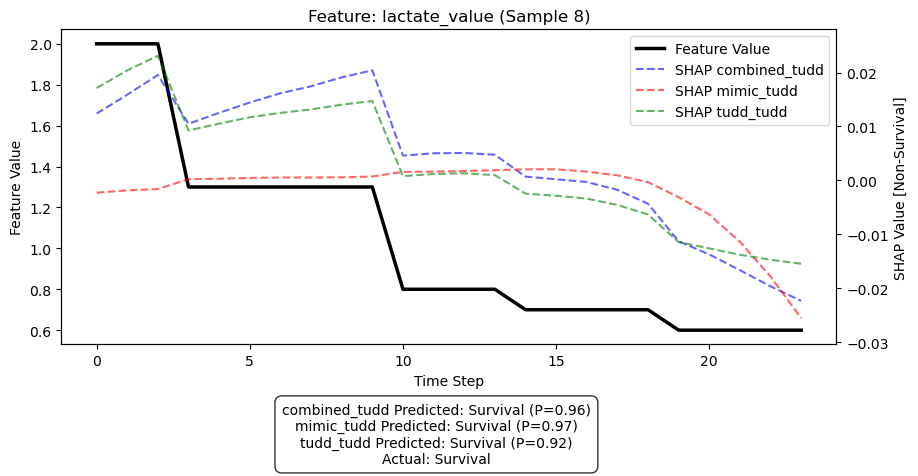

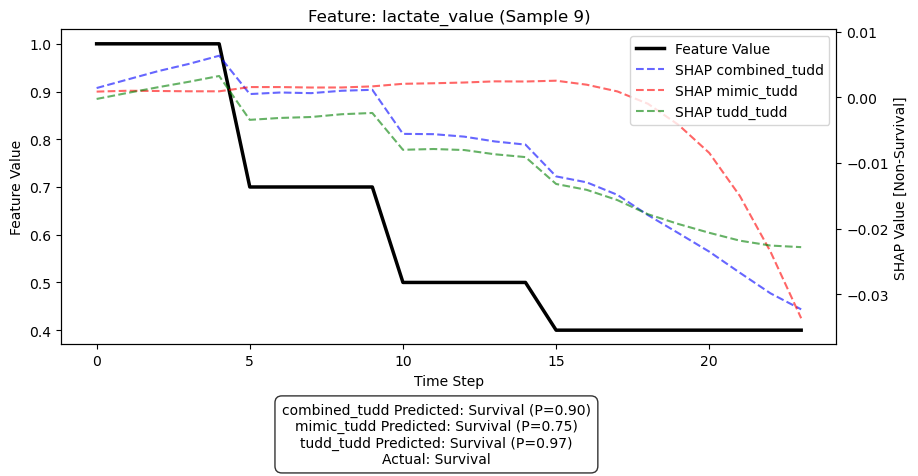

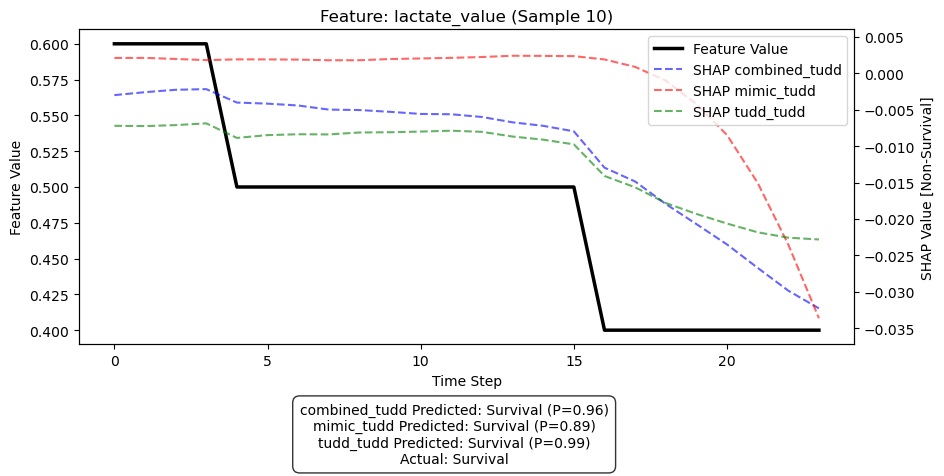

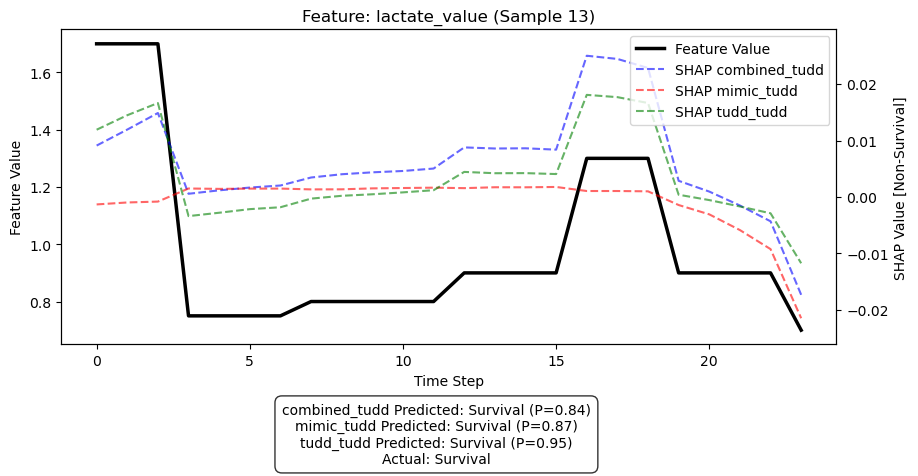

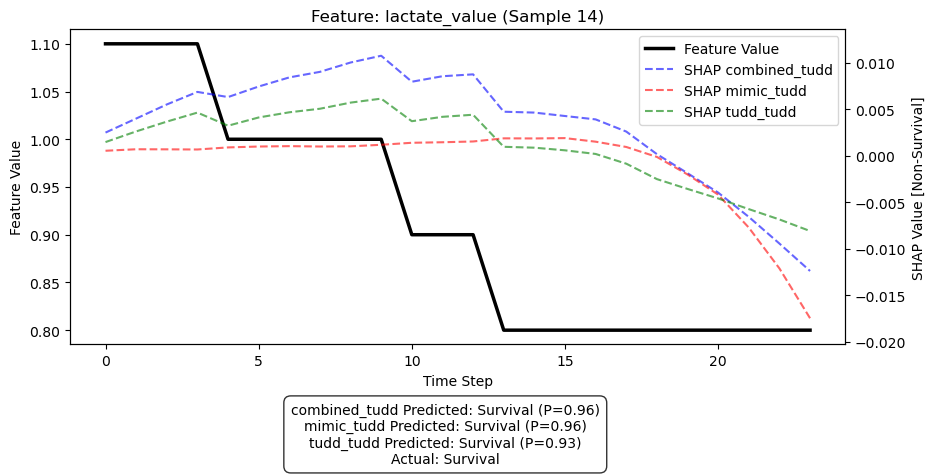

...

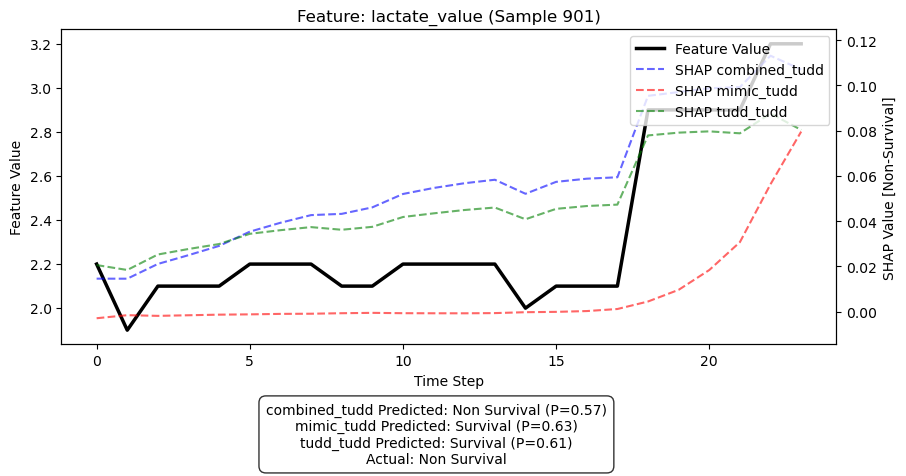

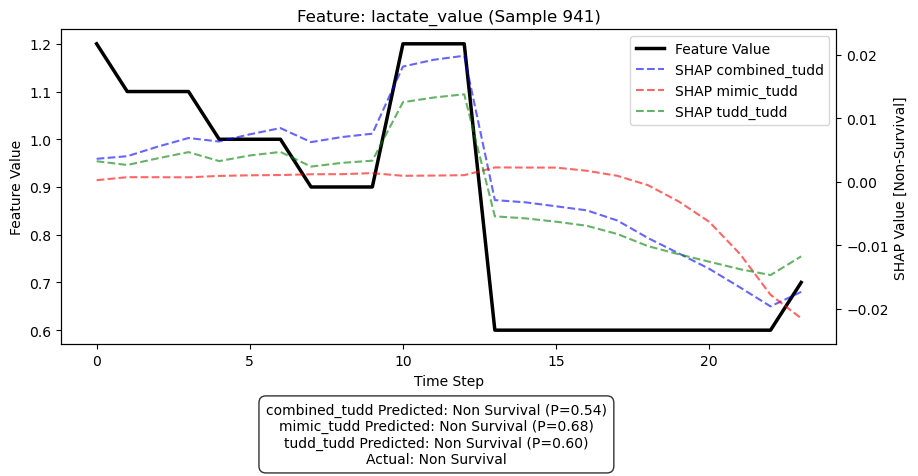

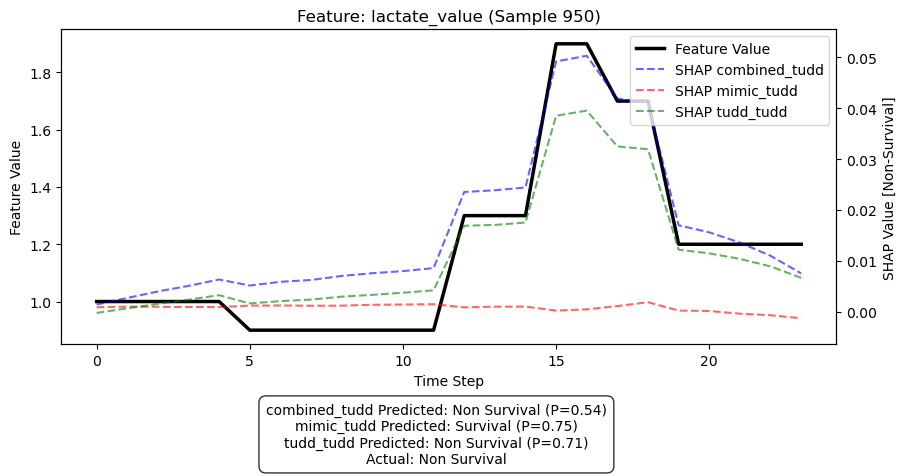

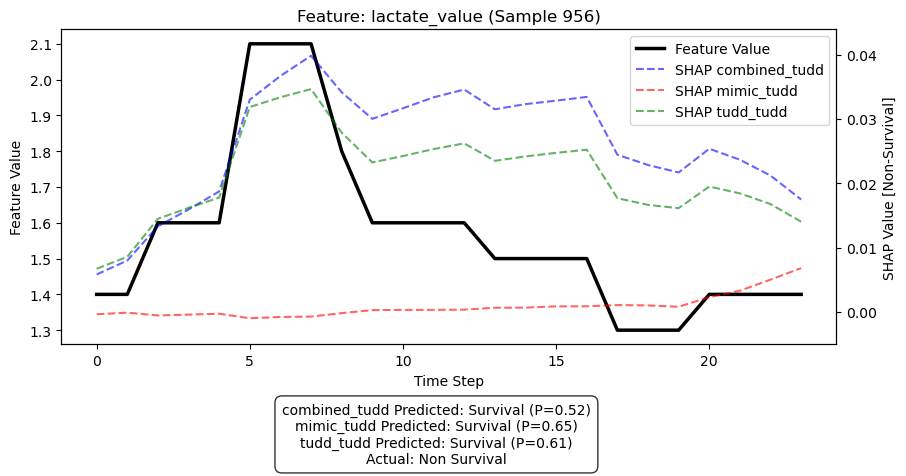

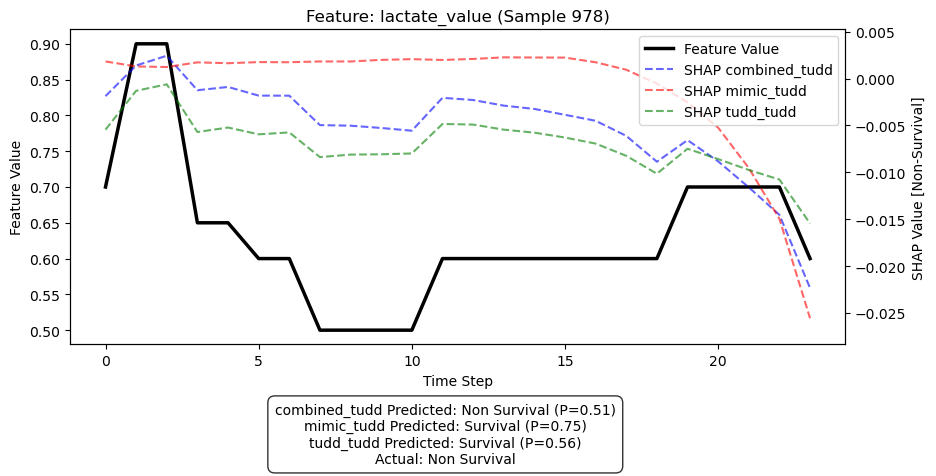

In [ ]:
#%%

import torch
import numpy as np
import matplotlib.pyplot as plt
from classes.explainer import LoadSHAPExplainer

# --- Define model names ---
model1_name = "combined_tudd"
model2_name = "mimic_tudd"
model3_name = "tudd_tudd"

# --- Load one set of SHAP values and test data for grouping ---
model_name = "multi_channel_lstm_static"  
num_samples = 1000      
dataset_name = 'combined_tudd' 

explainer = LoadSHAPExplainer(model=None, feature_names=None)
explainer.load_shap_values(model_name, num_samples, dataset_name)

# --- Define prediction thresholds ---
high_threshold = 0.8
low_threshold_lower = 0.4
low_threshold_upper = 0.6

pred_surv_actual_surv = []     
pred_non_surv_actual_surv = [] 
uncertain_actual_surv = []     

pred_surv_actual_non_surv = []      
pred_non_surv_actual_non_surv = [] 
uncertain_actual_non_surv = []      

# Classify samples based on test labels and predictions.
for idx in range(len(explainer.test_seq_data_np)):
    actual = explainer.test_labels_np[idx]
    pred = explainer.predictions[idx]
    p_surv = pred["p_surv"]
    p_non_surv = pred["p_non_surv"]
    
    is_uncertain = (low_threshold_lower <= p_surv <= low_threshold_upper) or (low_threshold_lower <= p_non_surv <= low_threshold_upper)
    
    if actual == 0:  # actual survival
        if p_surv >= high_threshold:
            pred_surv_actual_surv.append(idx)
        elif p_non_surv >= high_threshold:
            pred_non_surv_actual_surv.append(idx)
        elif is_uncertain:
            uncertain_actual_surv.append(idx)
    elif actual == 1:  # actual non survival
        if p_surv >= high_threshold:
            pred_surv_actual_non_surv.append(idx)
        elif p_non_surv >= high_threshold:
            pred_non_surv_actual_non_surv.append(idx)
        elif is_uncertain:
            uncertain_actual_non_surv.append(idx)


selected_pred_surv_actual_surv = pred_surv_actual_surv[:40]
selected_pred_non_surv_actual_surv = pred_non_surv_actual_surv[:40]
selected_uncertain_actual_surv = uncertain_actual_surv[:40]

selected_pred_surv_actual_non_surv = pred_surv_actual_non_surv[:40]
selected_pred_non_surv_actual_non_surv = pred_non_surv_actual_non_surv[:40]
selected_uncertain_actual_non_surv = uncertain_actual_non_surv[:40]

selected_indices = (selected_pred_surv_actual_surv +
                    selected_pred_non_surv_actual_surv +
                    selected_uncertain_actual_surv +
                    selected_pred_surv_actual_non_surv +
                    selected_pred_non_surv_actual_non_surv +
                    selected_uncertain_actual_non_surv)



print("Selected sample indices for actual survival (label=0):")
print("Predicted Survival:", selected_pred_surv_actual_surv)
print("Predicted Non Survival:", selected_pred_non_surv_actual_surv)
print("Uncertain:", selected_uncertain_actual_surv)

print("\nSelected sample indices for actual non survival (label=1):")
print("Predicted Survival:", selected_pred_surv_actual_non_surv)
print("Predicted Non Survival:", selected_pred_non_surv_actual_non_surv)
print("Uncertain:", selected_uncertain_actual_non_surv)

# --- Feature to explain ---
# 0: mps | 1: gcs | 6: wbc | 7: platelets | 5: hr 
# ['mbp_value', 'gcs_total_value', 'glc_value', 'creatinine_value', 'potassium_value', 'hr_value', 'wbc_value', 'platelets_value', 'inr_value', 'anion_gap_value', 'lactate_value', 'temperature_value', 'weight_value', 'age_value', 'gender_value']

feature_idx = 10
feature_to_explain = explainer.feature_names[feature_idx] if explainer.feature_names is not None else f"Feature {feature_idx}"

# --- Define JSON file paths for each training dataset ---
file_path1 = "SHAP_scores/multi_channel_lstm_static_combined_tudd_1000.json"
file_path2 = "SHAP_scores/multi_channel_lstm_static_mimic_tudd_1000.json"
file_path3 = "SHAP_scores/multi_channel_lstm_static_tudd_tudd_1000.json"

# --- Loop over selected samples and plot using the three-dataset function ---

#selected_indices = [idx for idx in range(len(explainer.test_seq_data_np))]
#selected_indices = selected_indices[:100]
#selected_indices = [0, 5, 8, 61]
for sample_idx in selected_indices:
    explainer.plot_single_feature_time_shap_three_train_datasets(
        file_path1=file_path1,
        file_path2=file_path2,
        file_path3=file_path3,
        sample_idx=sample_idx,
        feature_to_explain=feature_to_explain,
        model1_name=model1_name,
        model2_name=model2_name,
        model3_name=model3_name,
        feature_idx=feature_idx,
        input_type='sequential'
    )